# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import roc_auc_score
import lightgbm as lgb
import pickle
import gc

In [2]:
import scikitplot as skplt

# Scrutinizing every feature

In [17]:
df_train = pd.read_csv('data/train.csv')
X_train = df_train.drop(['ID_code', 'target'], axis=1)
y_train = df_train.target
Xtr, Xval, ytr, yval  = train_test_split(X_train, y_train, test_size = 0.05)
print(f"{Xtr.shape} {Xval.shape}")
print(f"1: {yval[yval == 1].shape[0]} | 0 : {yval[yval == 0].shape[0]}")

(190000, 200) (10000, 200)
1: 1013 | 0 : 8987


In [4]:
df_test = pd.read_csv('data/test.csv')
test_codes = df_test.ID_code
df_test = df_test.drop(['ID_code'], axis=1)

In [5]:
df_train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


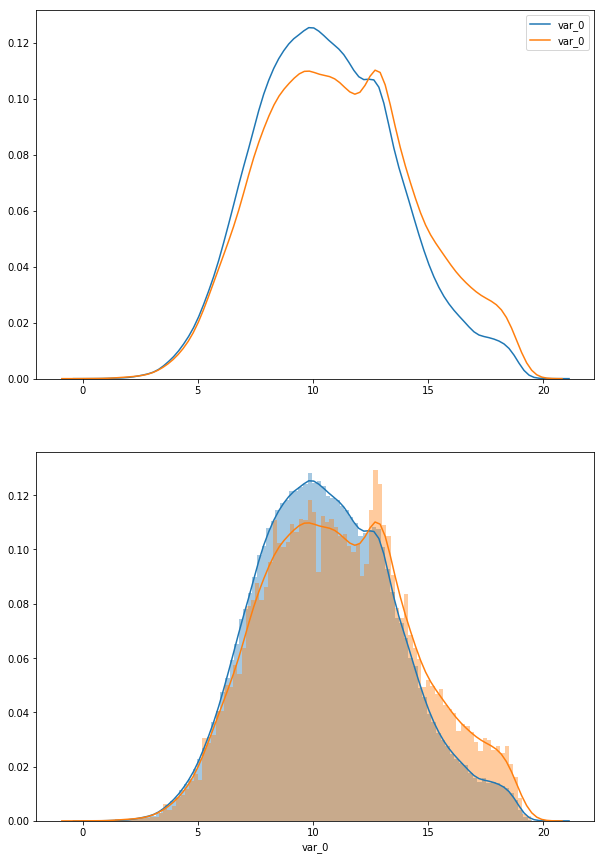

In [6]:
import seaborn as sns
plt.figure(figsize=(10,80))
plt.subplot(10, 1, 1)
sns.kdeplot(X_train.loc[df_train['target']==0]['var_0'], )
sns.kdeplot(X_train.loc[df_train['target']==1]['var_0'], )
plt.subplot(10, 1, 2)
sns.distplot(X_train.loc[df_train['target']==0]['var_0'], bins=100)
sns.distplot(X_train.loc[df_train['target']==1]['var_0'], bins=100)

# Plot all variables

On plot 0
On plot 1
On plot 2
On plot 3
On plot 4
On plot 5
On plot 6
On plot 7
On plot 8
On plot 9
On plot 10
On plot 11
On plot 12
On plot 13
On plot 14
On plot 15
On plot 16
On plot 17
On plot 18
On plot 19
On plot 20


/home/timetraveller/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


On plot 21
On plot 22
On plot 23
On plot 24
On plot 25
On plot 26
On plot 27
On plot 28
On plot 29
On plot 30
On plot 31
On plot 32
On plot 33
On plot 34
On plot 35
On plot 36
On plot 37
On plot 38
On plot 39
On plot 40
On plot 41
On plot 42
On plot 43
On plot 44
On plot 45
On plot 46
On plot 47
On plot 48
On plot 49
On plot 50
On plot 51
On plot 52
On plot 53
On plot 54
On plot 55
On plot 56
On plot 57
On plot 58
On plot 59
On plot 60
On plot 61
On plot 62
On plot 63
On plot 64
On plot 65
On plot 66
On plot 67
On plot 68
On plot 69
On plot 70
On plot 71
On plot 72
On plot 73
On plot 74
On plot 75
On plot 76
On plot 77
On plot 78
On plot 79
On plot 80
On plot 81
On plot 82
On plot 83
On plot 84
On plot 85
On plot 86
On plot 87
On plot 88
On plot 89
On plot 90
On plot 91
On plot 92
On plot 93
On plot 94
On plot 95
On plot 96
On plot 97
On plot 98
On plot 99
On plot 100
On plot 101
On plot 102
On plot 103
On plot 104
On plot 105
On plot 106
On plot 107
On plot 108
On plot 109
On plot 110

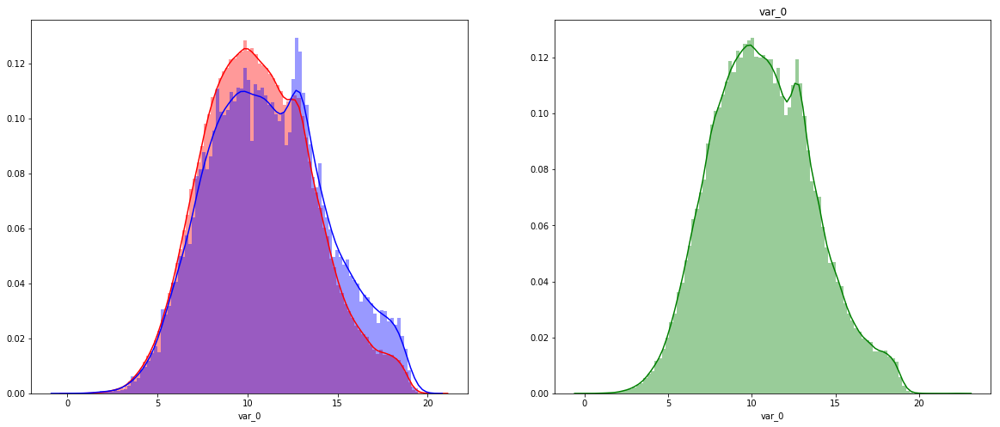

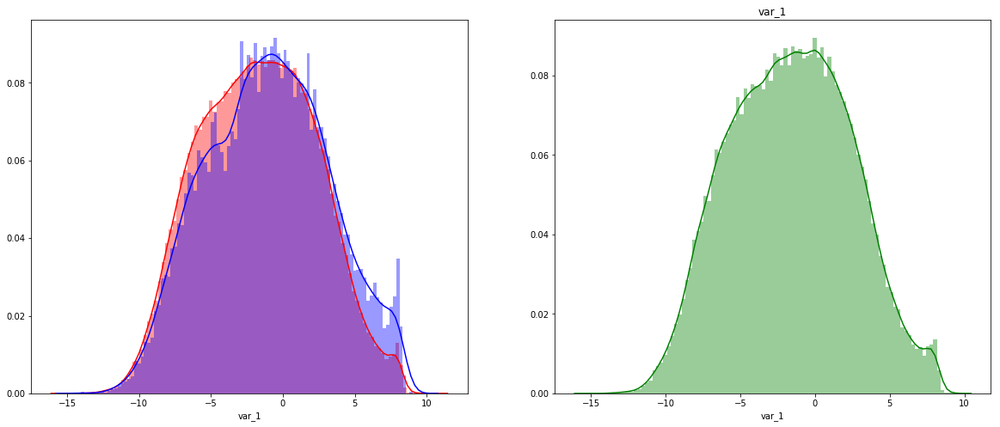

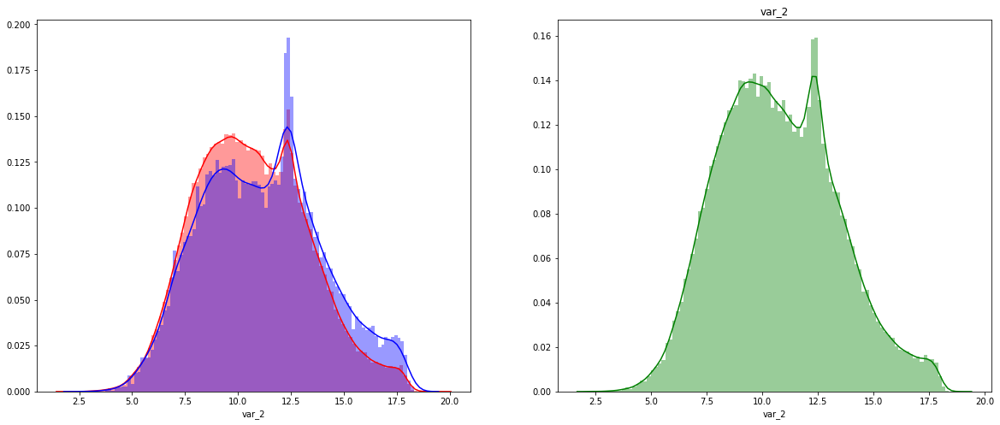

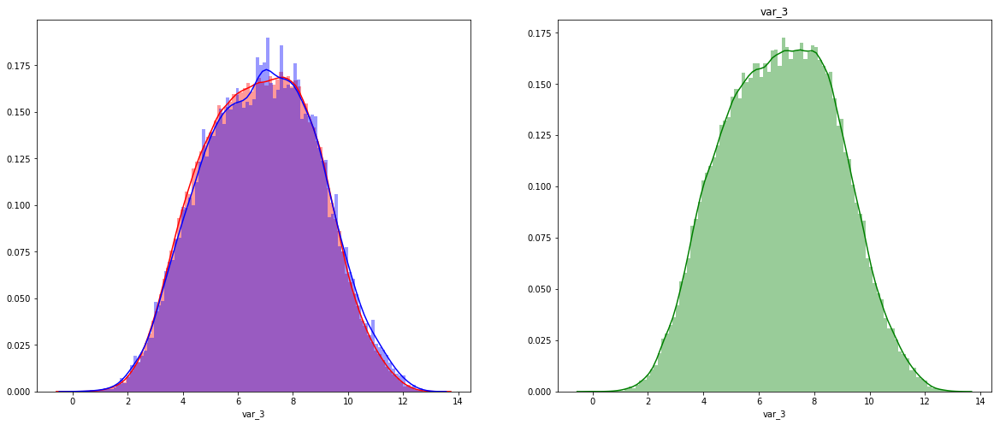

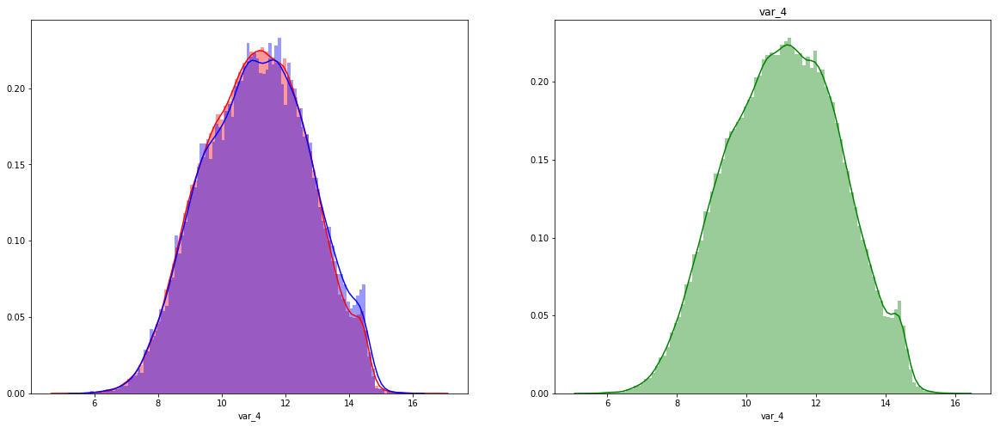

...

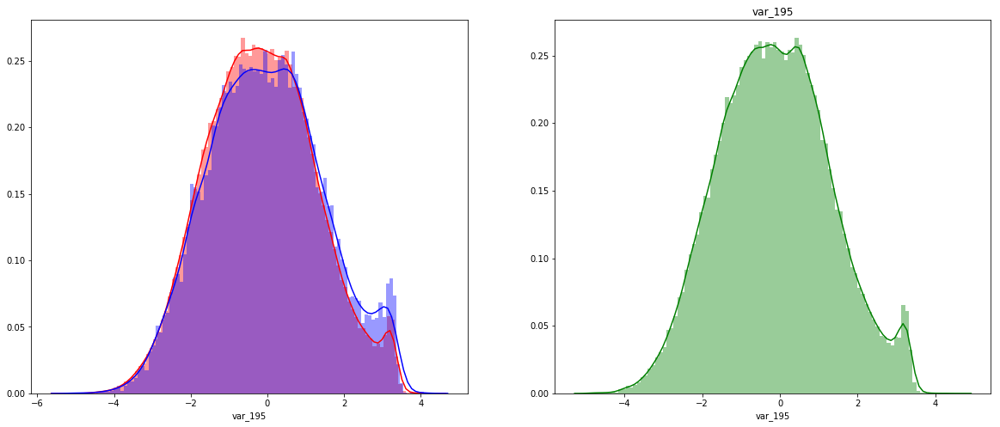

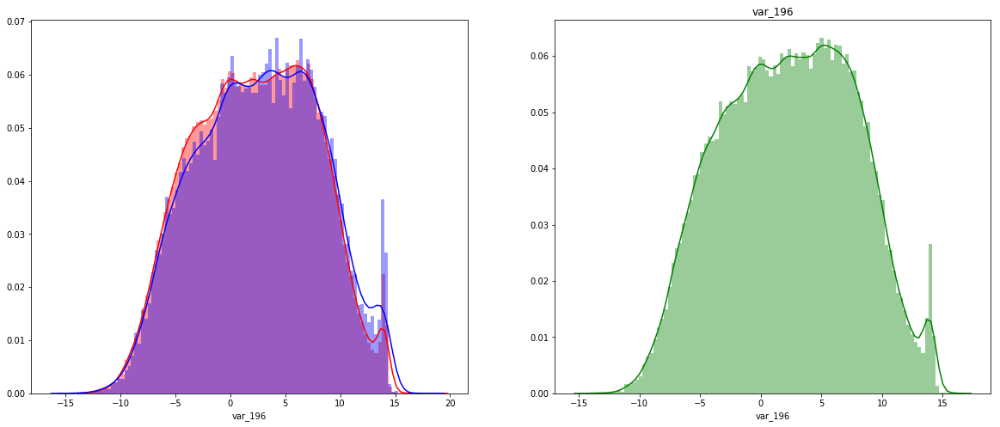

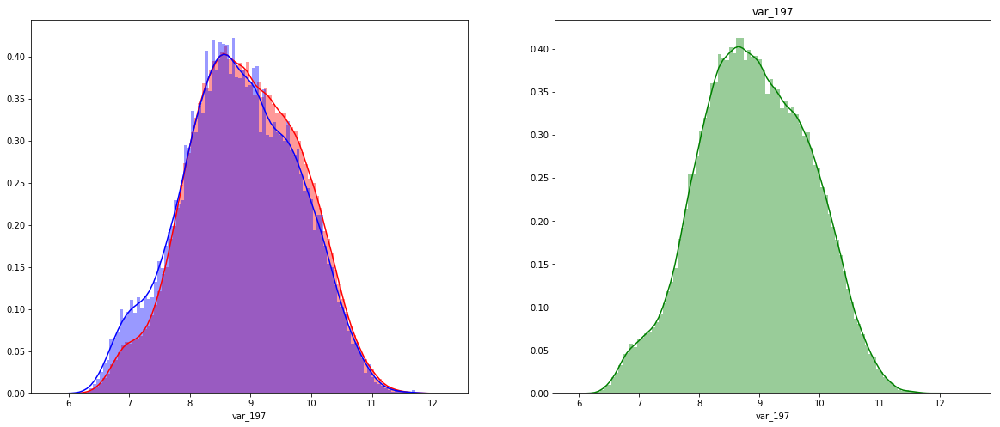

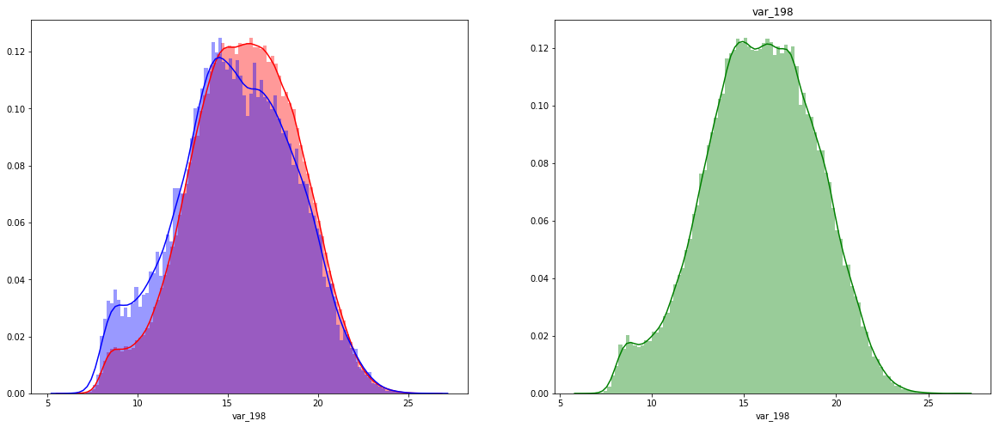

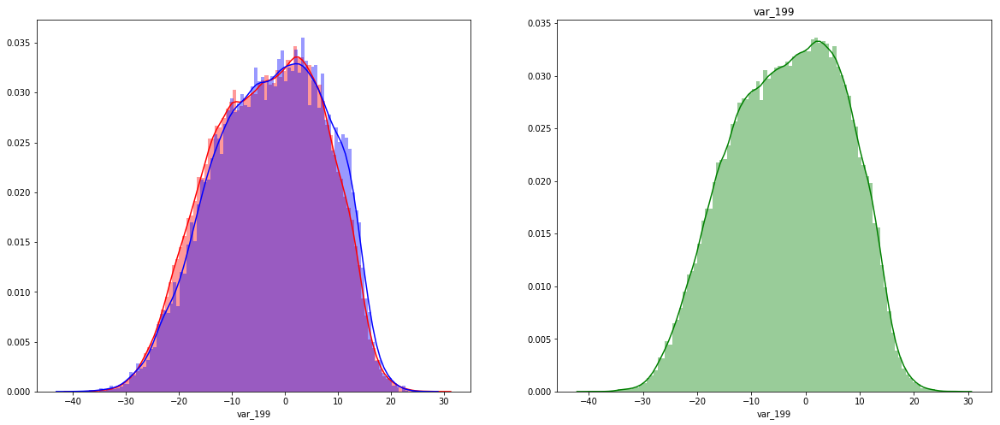

In [7]:
import seaborn as sns
l = []
for i, column in enumerate(X_train.columns):
    print(f"On plot {i}")
    plt.figure(figsize=(20,8))    
    plt.subplot(1, 2, 1)
    sns.distplot(X_train.loc[df_train['target']==0][column], bins=100, color='red')
    sns.distplot(X_train.loc[df_train['target']==1][column], bins=100, color='blue')
    plt.subplot(1, 2, 2)
    sns.distplot(df_test[column], bins=100, color='green')
    plt.title(column)

# Probability of transfer

In [18]:
df_train.drop('ID_code', axis=1, inplace=True)

In [27]:
sns.set_style("darkgrid")

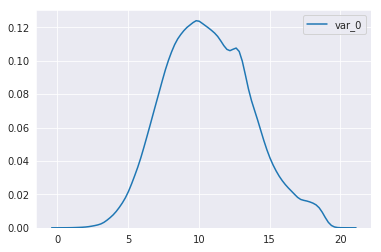

In [31]:
sns.kdeplot(df_train['var_0'])

In [34]:
train_df = pd.read_csv('data/train.csv')

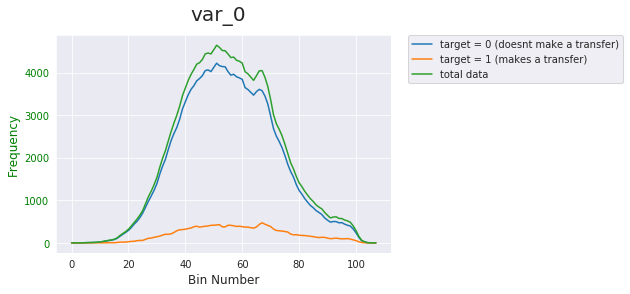

In [39]:
def running_mean(x, N):
   cumsum = np.cumsum(np.insert(x, 0, 0)) 
   return np.concatenate([x[0:N-1], (cumsum[N:] - cumsum[:-N]) / N])

var = 'var_0' #feat we are going to analyse
mydf = train_df.copy() #df we are going to analyze

def df_to_bin(var, mydf):
    IQR = mydf[var].quantile([0.75]).values - mydf[var].quantile([0.25]).values #inter-quartile range
    n = 200000 #size of our dataframe
    bin_size = 2.5*IQR/n**(1/3) #Freedman-Diaconis rule to define the bin size
    bin_number = int((mydf[var].max() - mydf[var].min())/bin_size)

    #creat new feature based on the bins
    mydf['new' + var] = pd.cut(mydf[var], bins = bin_number, labels = range(bin_number)).astype('float')

    #separate dfs betweens target ==0 and target == 1
    df_no_transfer = mydf['new' + var][mydf['target'] == 0].value_counts().sort_index()
    #get the bin frequency height (H) and the index of that bin (X)
    H0,X0 = list(df_no_transfer.values), list(df_no_transfer.index) 

    df_with_transfer = mydf['new' + var][mydf['target'] == 1].value_counts().sort_index()
    H1,X1 = list(df_with_transfer.values), list(df_with_transfer.index) 

    #If there are any bins with 0 frequency between 0 and the total number of bins, lets put it in our list
    for i in range(bin_number):
        if i not in X0:
            H0.append(0)
            X0.append(i)

        if i not in X1:
            H1.append(0)
            X1.append(i)

    #sort the bins so the list index == bin number
    H0 = [h for _,h in sorted(zip(X0,H0))]
    X0 = [x for x,_ in sorted(zip(X0,H0))]
    H1 = [h for _,h in sorted(zip(X1,H1))]
    X1 = [x for x,_ in sorted(zip(X1,H1))]

    H0 = running_mean(H0, 2)  
    H1 = running_mean(H1, 2)  
    Hsum = H0 + H1
    
    return bin_size, bin_number, mydf, H0, H1, Hsum, X0, X1

var = 'var_0'
bin_size, bin_number, mydf, H0, H1, Hsum, X0, X1 = df_to_bin(var, train_df)

#plot the result
fig, ax1 = plt.subplots()
ax1.plot(H0, label='target = 0 (doesnt make a transfer)')
ax1.plot(H1, label='target = 1 (makes a transfer)')
ax1.plot(Hsum, label='total data')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
fig.suptitle(var, fontsize=20)
ax1.set_ylabel('Frequency', color='g', fontsize=12)
ax1.tick_params(axis='y', colors='green')
plt.xlabel('Bin Number', fontsize=12)
plt.show()


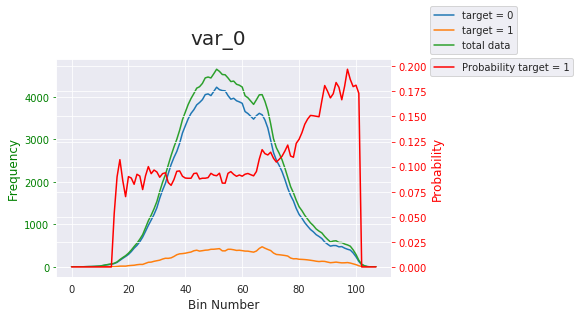

In [36]:
Hmin = 80
def get_probs(bin_number, H1, Hsum, Hmin):
    probs = []
    #finds min_i
    for i in range(bin_number):
        if Hsum[i] > Hmin:
            min_i = i
            break

    #finds max_i
    for i in reversed(range(bin_number)):
        if Hsum[i] > Hmin:
            max_i = i
            break

    #get probabilities to plot
    for i in range(0, bin_number):
        if i < min_i or i > max_i:
            probs.append(0)
        else:
            probs.append(H1[i]/Hsum[i]) 
    
    return probs, min_i, max_i

probs, min_i, max_i = get_probs(bin_number, H1, Hsum, Hmin)

#plot the result
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(H0, label='target = 0')
ax1.plot(H1, label='target = 1')
ax1.plot(Hsum, label='total data')
ax2.plot(probs, 'r', label='Probability target = 1')
ax1.legend(bbox_to_anchor=(1.10, 1), loc=3)
ax2.legend(bbox_to_anchor=(1.10, 0.90), loc=3)
fig.suptitle(var, fontsize=20)
ax1.set_ylabel('Frequency', color='g', fontsize=12)
ax1.tick_params(axis='y', colors='green')
ax2.set_ylabel('Probability', color='r', fontsize=12)
ax2.tick_params(axis='y', colors='red')
ax1.set_xlabel('Bin Number', fontsize=12)
plt.show()


In [110]:
mydf = df_train.copy()
var = 'var_0'
IQR = mydf[var].quantile([0.75]).values - mydf[var].quantile([0.25]).values #inter-quartile range
n = mydf.shape[0] 
bin_size = 2.5 * IQR / (n ** (1/3)) 
bin_number = int((mydf[var].max() - mydf[var].min())/bin_size)
key = 'prob' + var
mydf[key] = pd.cut(mydf[var], bins = bin_number, labels = range(bin_number)).astype('float')
df_map1 = mydf[mydf['target'] == 0].groupby(key)['target'].count()
df_map2 = mydf[mydf['target'] == 1].groupby(key)['target'].count()
df_map3 = mydf.groupby(key)['target'].count()
df_map_prob = (df_map2 / df_map3).fillna(0)
mydf[key] = mydf[key].map(df_map_prob)

In [111]:
mydf.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,probvar_0
0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914,0.090287
1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518,0.090068
2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965,0.088868
3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996,0.088262
4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104,0.093830


In [88]:
mydf.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,newvar_0
0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914,46.0
1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518,60.0
2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965,44.0
3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996,57.0
4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104,51.0


In [103]:
df_map_prob.shape

(107,)

# Box plot

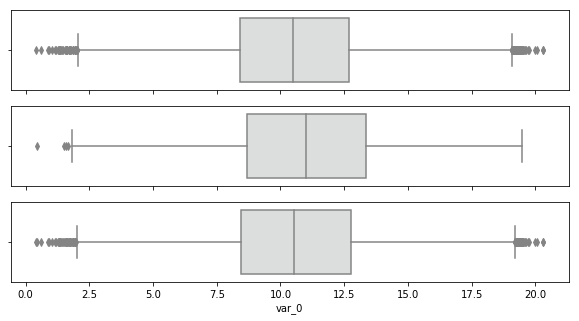

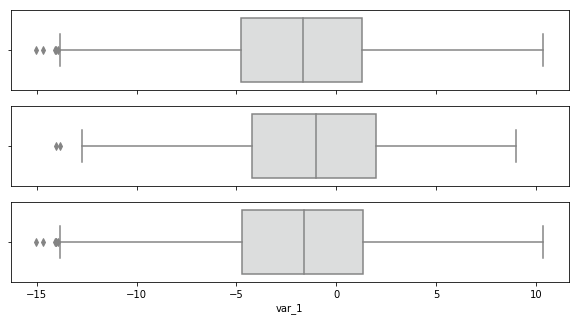

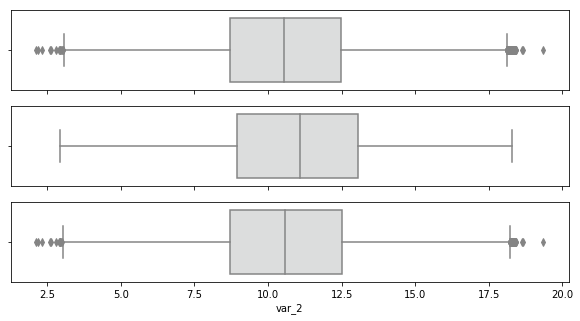

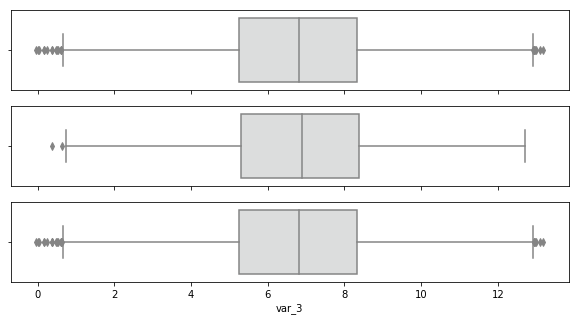

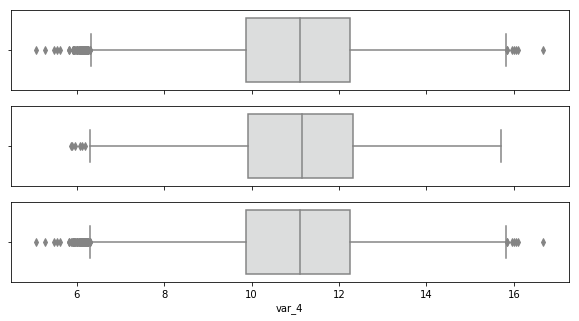

...

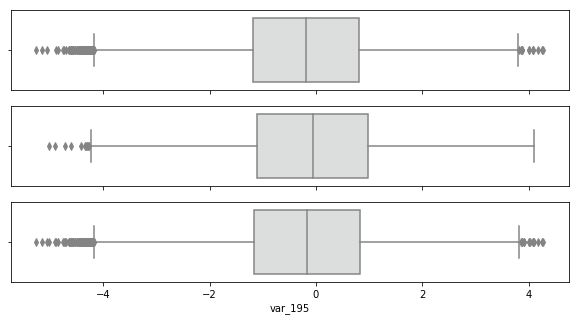

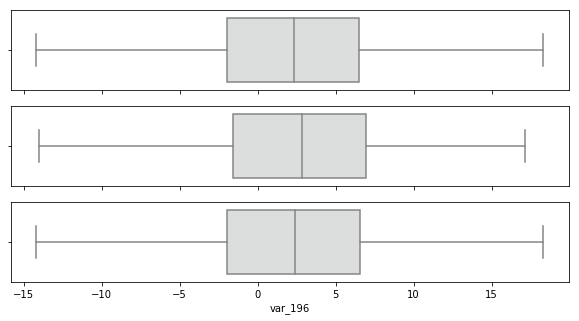

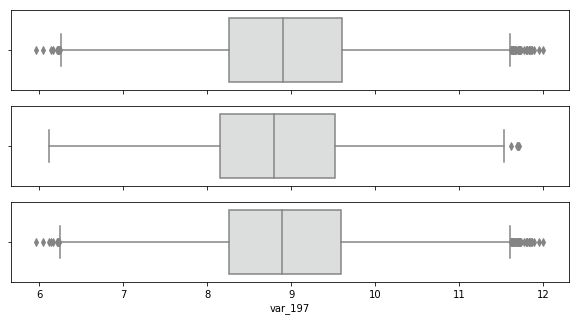

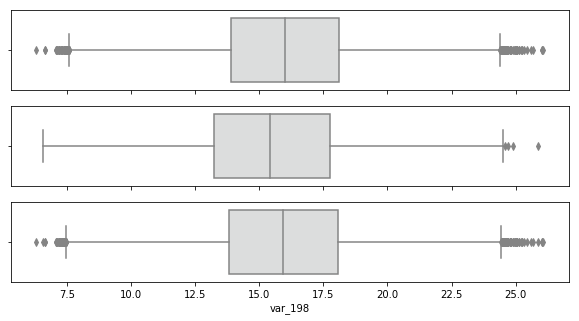

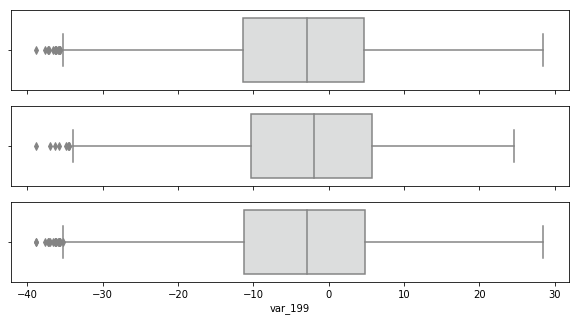

In [34]:
import seaborn as sns
l = []
for i, column in enumerate(X_train.columns):
    f, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize=(10, 5))
    sns.boxplot(X_train.loc[df_train['target']==0][column], ax=ax1, palette="coolwarm_r")
    sns.boxplot(X_train.loc[df_train['target']==1][column], ax=ax2, palette="coolwarm_r")
    sns.boxplot(X_train[column], ax=ax3, palette="coolwarm_r")    
    ax1.set(xlabel='')
    ax2.set(xlabel='')
    ax3.set(xlabel=str(column))

# Boosting creativity curves

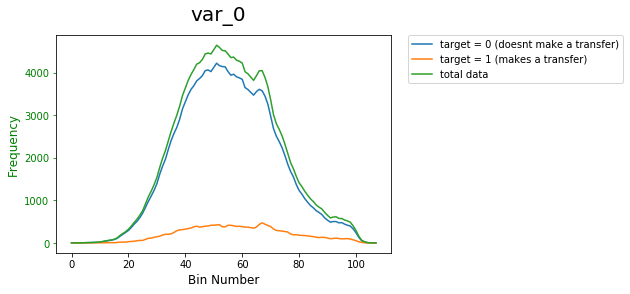

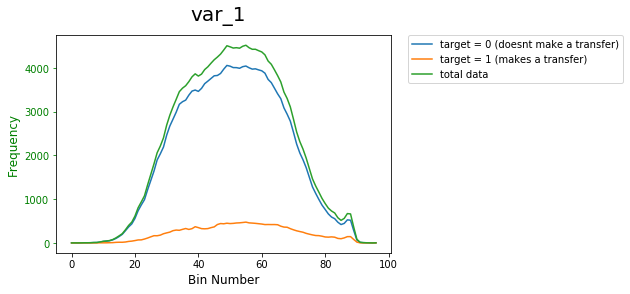

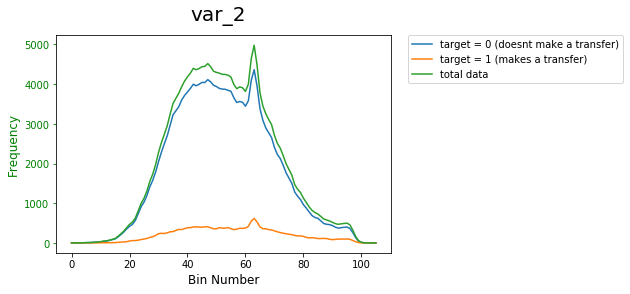

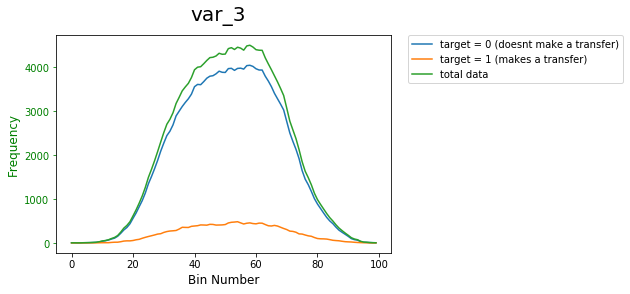

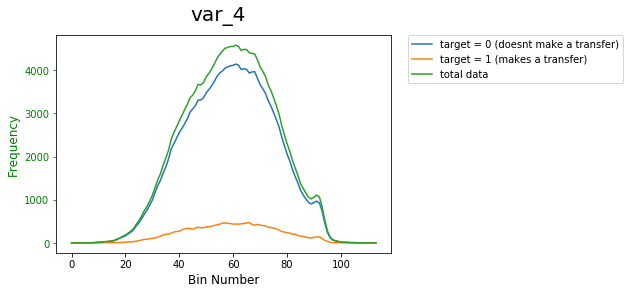

...

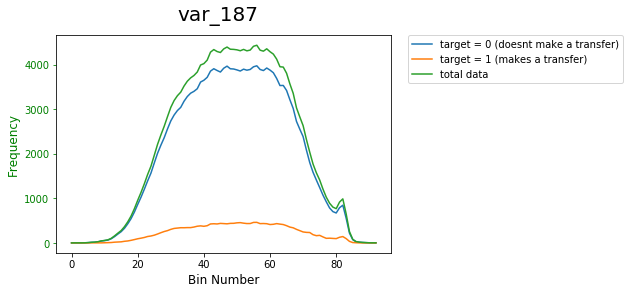

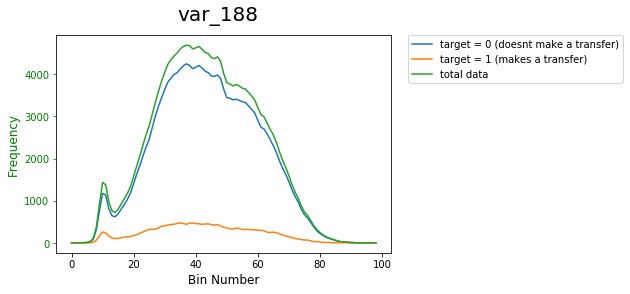

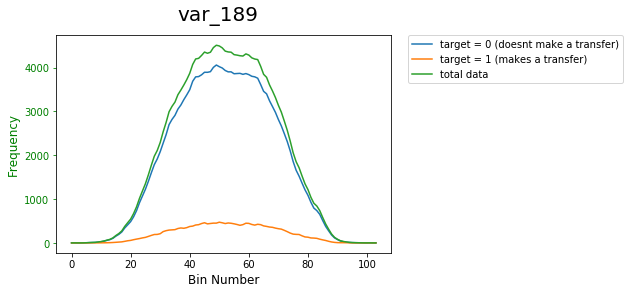

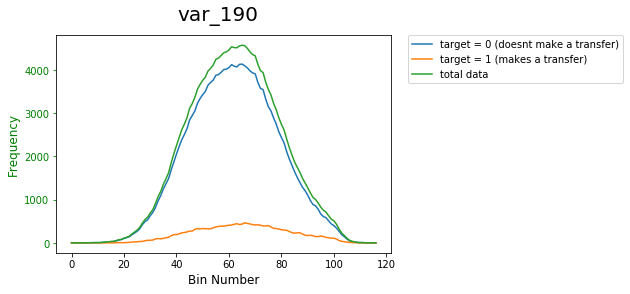

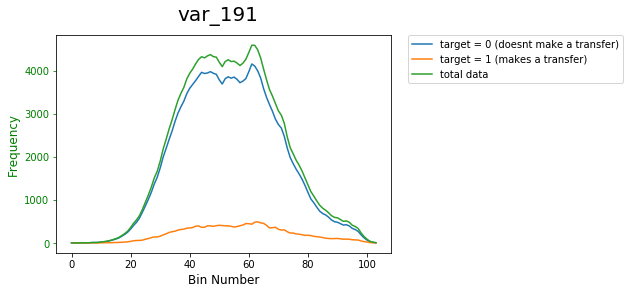

In [ ]:
def running_mean(x, N):
   cumsum = np.cumsum(np.insert(x, 0, 0)) 
   return np.concatenate([x[0:N-1], (cumsum[N:] - cumsum[:-N]) / N])
 
    
def df_to_bin(var, mydf):
    IQR = mydf[var].quantile([0.75]).values - mydf[var].quantile([0.25]).values #inter-quartile range
    n = 200000 #size of our dataframe
    bin_size = 2.5*IQR/n**(1/3) #Freedman-Diaconis rule to define the bin size
    bin_number = int((mydf[var].max() - mydf[var].min())/bin_size)

    #creat new feature based on the bins
    mydf['new' + var] = pd.cut(mydf[var], bins = bin_number, labels = range(bin_number)).astype('float')

    #separate dfs betweens target ==0 and target == 1
    df_no_transfer = mydf['new' + var][mydf['target'] == 0].value_counts().sort_index()
    #get the bin frequency height (H) and the index of that bin (X)
    H0,X0 = list(df_no_transfer.values), list(df_no_transfer.index) 

    df_with_transfer = mydf['new' + var][mydf['target'] == 1].value_counts().sort_index()
    H1,X1 = list(df_with_transfer.values), list(df_with_transfer.index) 

    #If there are any bins with 0 frequency between 0 and the total number of bins, lets put it in our list
    for i in range(bin_number):
        if i not in X0:
            H0.append(0)
            X0.append(i)

        if i not in X1:
            H1.append(0)
            X1.append(i)

    #sort the bins so the list index == bin number
    H0 = [h for _,h in sorted(zip(X0,H0))]
    X0 = [x for x,_ in sorted(zip(X0,H0))]
    H1 = [h for _,h in sorted(zip(X1,H1))]
    X1 = [x for x,_ in sorted(zip(X1,H1))]

    H0 = running_mean(H0, 2)  
    H1 = running_mean(H1, 2)  
    Hsum = H0 + H1
    
    return bin_size, bin_number, mydf, H0, H1, Hsum, X0, X1

for i in range(200):
    var = f'var_{i}'
    mydf = df_train.copy() #df we are going to analyze
    bin_size, bin_number, mydf, H0, H1, Hsum, X0, X1 = df_to_bin(var, df_train)
    fig, ax1 = plt.subplots()
    ax1.plot(H0, label='target = 0 (doesnt make a transfer)')
    ax1.plot(H1, label='target = 1 (makes a transfer)')
    ax1.plot(Hsum, label='total data')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    fig.suptitle(var, fontsize=20)
    ax1.set_ylabel('Frequency', color='g', fontsize=12)
    ax1.tick_params(axis='y', colors='green')
    plt.xlabel('Bin Number', fontsize=12)
    plt.show()